# Enegramas

In [1]:
import nltk
nltk.download('book')
from nltk.book import *

[nltk_data] Downloading collection 'book'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /home/rml/nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package brown to /home/rml/nltk_data...
[nltk_data]    |   Package brown is already up-to-date!
[nltk_data]    | Downloading package chat80 to /home/rml/nltk_data...
[nltk_data]    |   Package chat80 is already up-to-date!
[nltk_data]    | Downloading package cmudict to /home/rml/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package conll2000 to
[nltk_data]    |     /home/rml/nltk_data...
[nltk_data]    |   Package conll2000 is already up-to-date!
[nltk_data]    | Downloading package conll2002 to
[nltk_data]    |     /home/rml/nltk_data...
[nltk_data]    |   Package conll2002 is already up-to-date!
[nltk_data]    | Downloading package dependency_treebank to
[nltk_data]    |     /home/rml/nltk_data...
[nltk_data]    |   Package

*** Introductory Examples for the NLTK Book ***
Loading text1, ..., text9 and sent1, ..., sent9
Type the name of the text or sentence to view it.
Type: 'texts()' or 'sents()' to list the materials.
text1: Moby Dick by Herman Melville 1851
text2: Sense and Sensibility by Jane Austen 1811
text3: The Book of Genesis
text4: Inaugural Address Corpus
text5: Chat Corpus
text6: Monty Python and the Holy Grail
text7: Wall Street Journal
text8: Personals Corpus
text9: The Man Who Was Thursday by G . K . Chesterton 1908


In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px

In [3]:
md_bigrams = list(bigrams(text1))
fdist = FreqDist(md_bigrams)

In [4]:
fdist.most_common(10)

[((',', 'and'), 2607),
 (('of', 'the'), 1847),
 (("'", 's'), 1737),
 (('in', 'the'), 1120),
 ((',', 'the'), 908),
 ((';', 'and'), 853),
 (('to', 'the'), 712),
 (('.', 'But'), 596),
 ((',', 'that'), 584),
 (('.', '"'), 557)]

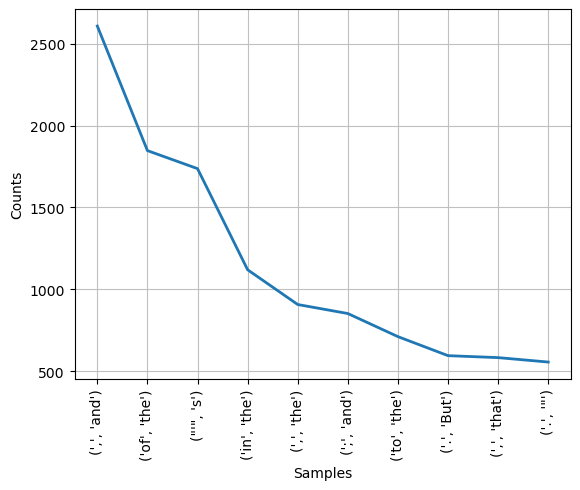

In [5]:
fdist.plot(10)
plt.show()

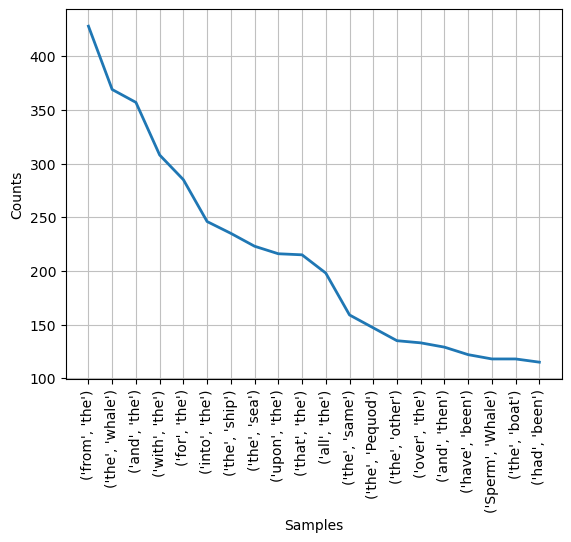

<AxesSubplot: xlabel='Samples', ylabel='Counts'>

In [6]:
threshold = 2
filtered_bigrams = [bigram for bigram in md_bigrams if len(bigram[0]) > threshold and len(bigram[1]) > threshold]
filtered_dist = FreqDist(filtered_bigrams)
filtered_dist.plot(20)

# Trigramas

In [7]:
from nltk.util import ngrams

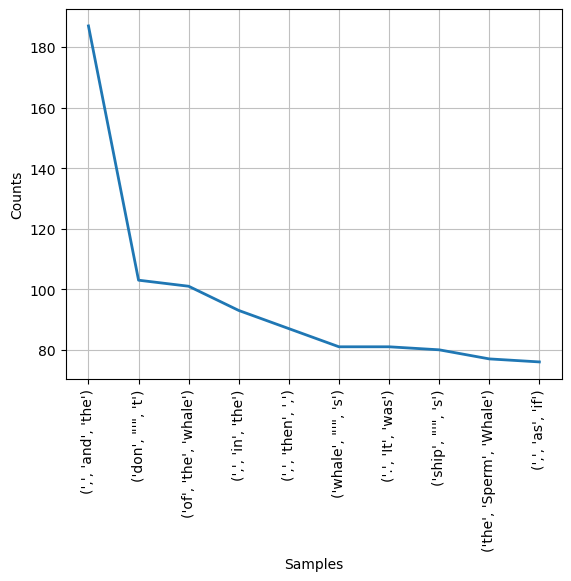

<AxesSubplot: xlabel='Samples', ylabel='Counts'>

In [8]:
md_trigrams = ngrams(text1, 3)
fdist = FreqDist(md_trigrams)
fdist.most_common(10)
fdist.plot(10)

In [9]:
df = pd.DataFrame()
df['bi_grams'] = list(set(filtered_bigrams))
df['word_0'] = df.bi_grams.apply(lambda x: x[0])
df['word_1'] = df.bi_grams.apply(lambda x: x[1])
df

,bi_grams,word_0,word_1
0,"(like, Bildad)",like,Bildad
1,"(still, worse)",still,worse
2,"(your, capstan)",your,capstan
3,"(enchanted, crew)",enchanted,crew
4,"(nothing, less)",nothing,less
...,...,...,...
67937,"(great, heedfulness)",great,heedfulness
67938,"(these, qualities)",these,qualities
67939,"(myself, were)",myself,were
67940,"(cause, her)",cause,her


# PMI 
$$ PMI = \log\left(\frac{P(w_1, w_2)}{P(w_1)P(w_2)}\right) $$

In [10]:
filtered_words = [word for word in text1 if len(word) > threshold]
filtered_words_dist = FreqDist(filtered_words)

In [11]:
df = pd.DataFrame()
df['bi_gram'] = list(set(filtered_bigrams))
df['word_0'] = df.bi_gram.apply(lambda x: x[0])
df['word_1'] = df.bi_gram.apply(lambda x: x[1])
df['bi_gram_freq'] = df.bi_gram.apply(lambda x: filtered_dist[x]) 
df['word_0_freq'] = df.word_0.apply(lambda x: filtered_words_dist[x])
df['word_1_freq'] = df.word_1.apply(lambda x: filtered_words_dist[x])
df.head()

,bi_gram,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq
0,"(like, Bildad)",like,Bildad,1,624,76
1,"(still, worse)",still,worse,1,299,21
2,"(your, capstan)",your,capstan,1,240,12
3,"(enchanted, crew)",enchanted,crew,1,12,139
4,"(nothing, less)",nothing,less,1,102,51


In [12]:
df['PMI'] = df[['bi_gram_freq', 'word_0_freq', 'word_1_freq']].apply(lambda x: np.log2(x.values[0] / x.values[1] * x.values[2]), axis=1)
df['log(bi_gram_freq)'] = df['bi_gram_freq'].apply(lambda x: np.log2(x))
df.head()

,bi_gram,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq,PMI,log(bi_gram_freq)
0,"(like, Bildad)",like,Bildad,1,624,76,-3.037475,0.0
1,"(still, worse)",still,worse,1,299,21,-3.831684,0.0
2,"(your, capstan)",your,capstan,1,240,12,-4.321928,0.0
3,"(enchanted, crew)",enchanted,crew,1,12,139,3.533979,0.0
4,"(nothing, less)",nothing,less,1,102,51,-1.000000,0.0


In [13]:
df.sort_values(by='PMI', ascending=True).head()

,bi_gram,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq,PMI,log(bi_gram_freq)
32827,"(the, construction)",the,construction,1,13721,1,-13.744098,0.0
41654,"(the, forecastles)",the,forecastles,1,13721,1,-13.744098,0.0
25475,"(the, speediest)",the,speediest,1,13721,1,-13.744098,0.0
17154,"(the, shady)",the,shady,1,13721,1,-13.744098,0.0
30659,"(the, andirons)",the,andirons,1,13721,1,-13.744098,0.0


In [14]:
fig = px.scatter(x = df['PMI'].values, y = df['log(bi_gram_freq)'].values, color = df['PMI']+df['log(bi_gram_freq)'], 
                 size = (df['PMI']+df['log(bi_gram_freq)']).apply(lambda x: 1/(1+abs(x))).values, 
                 hover_name = df['bi_gram'].values, width = 600, height = 600, labels = {'x': 'PMI', 'y': 'Log(Bigram Frequency)'})
fig.show()

In [15]:
from nltk.collocations import *

In [16]:
bigram_measure = nltk.collocations.BigramAssocMeasures()
finder = BigramCollocationFinder.from_words(text1)

In [17]:
finder.apply_freq_filter(20)
finder.nbest(bigram_measure.pmi, 10)

[('Moby', 'Dick'),
 ('Sperm', 'Whale'),
 ('White', 'Whale'),
 ('Right', 'Whale'),
 ('Captain', 'Peleg'),
 (',"', 'said'),
 ('never', 'mind'),
 ('!"', 'cried'),
 ('no', 'means'),
 ('each', 'other')]

In [19]:
nltk.download('cess_esp')
corpus = nltk.corpus.cess_esp.sents()
flatten_corpus = [w for l in corpus for w in l]

[nltk_data] Downloading package cess_esp to /home/rml/nltk_data...
[nltk_data]   Package cess_esp is already up-to-date!


In [22]:
finder = BigramCollocationFinder.from_documents(corpus)
finder.apply_freq_filter(10)
finder.nbest(bigram_measure.pmi, 10)

[('señora', 'Aguirre'),
 ('secretario', 'general'),
 ('elecciones', 'generales'),
 ('campaña', 'electoral'),
 ('quiere', 'decir'),
 ('Se', 'trata'),
 ('segunda', 'vuelta'),
 ('director', 'general'),
 ('primer', 'ministro'),
 ('primer', 'lugar')]